#Лабораторная работа №5 Каскады Хаара, преобразования и работа с ключевыми точками

## Часть 1 Реализация алгоритмов Хаара

#Задание 1
Для шаблона Хаара H

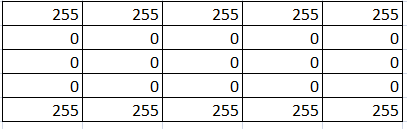

Выполните обработку произвольного изображения (https://pcnews.ru/blogs/rabota_kaskada_haara_v_opencv_v_kartinkah_teoria_i_praktika-546428.html#gsc.tab=0). *Достаточно получения карты признаков через разность областей.

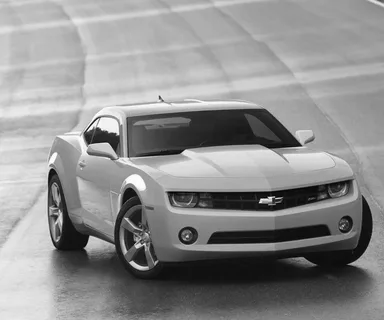

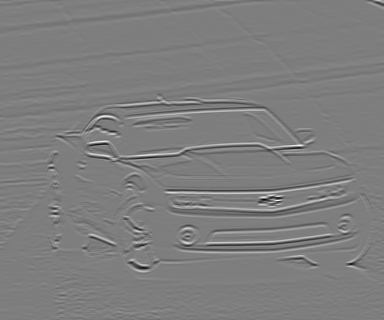

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def apply_haar_template(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print("Ошибка загрузки изображения")
        return

    height, width = img.shape
    feature_map = np.zeros((height, width), dtype=np.float32)

    template_height, template_width = 5, 5
    pad_h = template_height // 2
    pad_w = template_width // 2

    padded_img = cv2.copyMakeBorder(img, pad_h, pad_h, pad_w, pad_w, cv2.BORDER_REFLECT)

    for i in range(height):
        for j in range(width):
            roi = padded_img[i:i+template_height, j:j+template_width]

            white_region1 = roi[0, :]
            white_region2 = roi[4, :]
            black_region = roi[1:4, :]

            white_sum = np.sum(white_region1) + np.sum(white_region2)
            black_sum = np.sum(black_region)

            white_pixels = white_region1.size + white_region2.size
            black_pixels = black_region.size

            white_avg = white_sum / white_pixels if white_pixels > 0 else 0
            black_avg = black_sum / black_pixels if black_pixels > 0 else 0

            feature_value = white_avg - black_avg
            feature_map[i, j] = feature_value

    feature_map_normalized = cv2.normalize(feature_map, None, 0, 255, cv2.NORM_MINMAX)
    feature_map_uint8 = np.uint8(feature_map_normalized)

    cv2_imshow(img)
    cv2_imshow(feature_map_uint8)

apply_haar_template('car_1.jpg')

##Задание 2

Для шаблона Хаара H

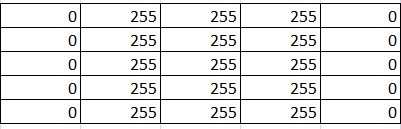

Выполните обработку того же изображения, что и в задании 1. *Достаточно получить карту признаков за счет разности яркости в областях.

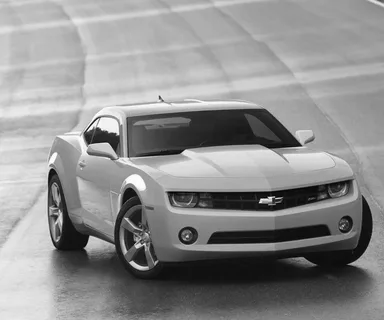

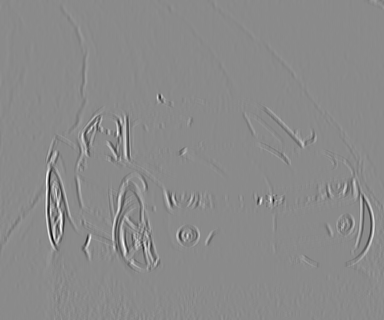

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def apply_haar_template(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        print("Ошибка загрузки изображения")
        return

    height, width = img.shape
    feature_map = np.zeros((height, width), dtype=np.float32)

    template_height, template_width = 5, 5
    pad_h = template_height // 2
    pad_w = template_width // 2

    padded_img = cv2.copyMakeBorder(img, pad_h, pad_h, pad_w, pad_w, cv2.BORDER_REFLECT)

    for i in range(height):
        for j in range(width):
            roi = padded_img[i:i+template_height, j:j+template_width]

            white_region = roi[:, 1:4]
            black_region1 = roi[:, 0]
            black_region2 = roi[:, 4]

            white_sum = np.sum(white_region)
            black_sum = np.sum(black_region1) + np.sum(black_region2)

            white_pixels = white_region.size
            black_pixels = black_region1.size + black_region2.size

            white_avg = white_sum / white_pixels if white_pixels > 0 else 0
            black_avg = black_sum / black_pixels if black_pixels > 0 else 0

            feature_value = white_avg - black_avg
            feature_map[i, j] = feature_value

    feature_map_normalized = cv2.normalize(feature_map, None, 0, 255, cv2.NORM_MINMAX)
    feature_map_uint8 = np.uint8(feature_map_normalized)

    cv2_imshow(img)
    cv2_imshow(feature_map_uint8)

apply_haar_template('car_1.jpg')

##Часть 2 Обнаружение лиц методом Виолы-Джонса

##Задание 1
Загрузите в систему каскады Хаара (haar_cascades.zip). Ознакомьтесь с содержимым xml-файлов. Создайте переменные с несколькими шаблонами для лиц (3 штуки) для будущего сравнения.

In [ ]:
path = '/content/haarcascade_frontalcatface.xml'

##Задание 2

Реализуйте детектор лиц на изображениях с использованием каскадов Хаара (https://github.com/yunwoong7/haar_cascades_face_recognition/tree/main). Проверьте его работу на тестовых изображениях при разных шаблонах.

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

face_cascade1 = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')
face_cascade2 = cv2.CascadeClassifier('haarcascade_eye.xml')

def detect_faces_and_eyes(image_path, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30)):
    img = cv2.imread(image_path)
    if img is None:
        print("Ошибка загрузки изображения")
        return None, None

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    faces = face_cascade1.detectMultiScale(
        gray,
        scaleFactor=scaleFactor,
        minNeighbors=minNeighbors,
        minSize=minSize,
        flags=cv2.CASCADE_SCALE_IMAGE
    )

    eyes = face_cascade2.detectMultiScale(
        gray,
        scaleFactor=scaleFactor,
        minNeighbors=minNeighbors,
        minSize=(20, 20),
        flags=cv2.CASCADE_SCALE_IMAGE
    )

    face_result = img.copy()
    eye_result = img.copy()
    combined_result = img.copy()

    for (x, y, w, h) in faces:
        cv2.rectangle(face_result, (x, y), (x+w, y+h), (0, 255, 0), 2)
        cv2.rectangle(combined_result, (x, y), (x+w, y+h), (0, 255, 0), 2)

    for (x, y, w, h) in eyes:
        cv2.rectangle(eye_result, (x, y), (x+w, y+h), (255, 0, 0), 2)
        cv2.rectangle(combined_result, (x, y), (x+w, y+h), (255, 0, 0), 2)

    return face_result, eye_result, combined_result, len(faces), len(eyes)

def test_different_templates(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    results = {}

    scale_factors = [1.1, 1.2, 1.3]
    min_neighbors_list = [3, 5, 7]

    for scale in scale_factors:
        for neighbors in min_neighbors_list:
            faces = face_cascade1.detectMultiScale(
                gray,
                scaleFactor=scale,
                minNeighbors=neighbors,
                minSize=(30, 30)
            )

            eyes = face_cascade2.detectMultiScale(
                gray,
                scaleFactor=scale,
                minNeighbors=neighbors,
                minSize=(20, 20)
            )

            result_img = img.copy()
            for (x, y, w, h) in faces:
                cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)
            for (x, y, w, h) in eyes:
                cv2.rectangle(result_img, (x, y), (x+w, y+h), (255, 0, 0), 2)

            key = f'scale_{scale}_neighbors_{neighbors}'
            results[key] = (result_img, len(faces), len(eyes))

    return results

image_path = 'Angela_Merkel.jpg'

print("Детекция лиц и глаз:")
face_result, eye_result, combined_result, face_count, eye_count = detect_faces_and_eyes(image_path)

print(f"Обнаружено лиц: {face_count}")
print(f"Обнаружено глаз: {eye_count}")

cv2_imshow(face_result)
cv2_imshow(eye_result)
cv2_imshow(combined_result)

print("\nТестирование с разными параметрами детекции:")
param_results = test_different_templates(image_path)

for param_name, (result_img, face_count, eye_count) in param_results.items():
    print(f"{param_name}: лица={face_count}, глаза={eye_count}")
    cv2_imshow(result_img)

def detect_in_face_roi(image_path):
    img = cv2.imread(image_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    faces = face_cascade1.detectMultiScale(gray, 1.1, 5, minSize=(30, 30))

    result_img = img.copy()

    for (x, y, w, h) in faces:
        cv2.rectangle(result_img, (x, y), (x+w, y+h), (0, 255, 0), 2)

        face_roi_gray = gray[y:y+h, x:x+w]
        face_roi_color = result_img[y:y+h, x:x+w]

        eyes = face_cascade2.detectMultiScale(face_roi_gray, 1.1, 3, minSize=(20, 20))

        for (ex, ey, ew, eh) in eyes:
            cv2.rectangle(face_roi_color, (ex, ey), (ex+ew, ey+eh), (255, 0, 0), 2)

    return result_img, len(faces), sum([len(face_cascade2.detectMultiScale(gray[y:y+h, x:x+w], 1.1, 3)) for (x, y, w, h) in faces])

print("\nДетекция глаз только в областях лиц:")
roi_result, roi_faces, roi_eyes = detect_in_face_roi(image_path)
print(f"Лица: {roi_faces}, Глаза в областях лиц: {roi_eyes}")
cv2_imshow(roi_result)

##Задание 3
Подготовьте тестовую выборку следующего формата:

1) 10 изображений, где одно лицо, занимает больше 70% площади;

2) 10 изображений, где одно лицо, занимает меньше 20% площади;

3) 5 изображений, где два лица;

4) 5 изображений, где 3 и более лиц.

Сравните разные каскады по скорости и точности обнаружения для каждой подчасти датасета.

In [ ]:
import time

face_cascades = {
    "default": cv2.CascadeClassifier('haarcascade_frontalface_default.xml'),
    "alt": cv2.CascadeClassifier('haarcascade_frontalface_alt.xml'),
    "alt2": cv2.CascadeClassifier('haarcascade_frontalface_alt2.xml'),
    "profile": cv2.CascadeClassifier('haarcascade_profileface.xml')
}

def detect_faces(cascade, gray, params):
    faces = cascade.detectMultiScale(
        gray,
        scaleFactor=params["scaleFactor"],
        minNeighbors=params["minNeighbors"],
        minSize=params.get("minSize", (30, 30))
    )
    return faces

def evaluate_on_dataset(image_paths, annotations, cascade_name, cascade, params):
    TP = 0
    FP = 0
    FN = 0
    times = []
    for img_path, ann in zip(image_paths, annotations):
        img = cv2.imread(img_path)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        t0 = time.time()
        dets = detect_faces(cascade, gray, params)
        t1 = time.time()
        times.append(t1 - t0)

        matched = set()
        for (gx, gy, gw, gh) in ann['bboxes']:
            found = False
            for i, (dx, dy, dw, dh) in enumerate(dets):
                ix = max(gx, dx)
                iy = max(gy, dy)
                ax = min(gx+gw, dx+dw)
                ay = min(gy+gh, dy+dh)
                w_int = max(0, ax - ix)
                h_int = max(0, ay - iy)
                area_int = w_int * h_int
                area_union = gw*gh + dw*dh - area_int
                if area_int / area_union > 0.5:
                    found = True
                    matched.add(i)
                    break
            if found:
                TP += 1
            else:
                FN += 1
        FP += len(dets) - len(matched)
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    avg_time = sum(times) / len(times)
    return {
        "TP": TP, "FP": FP, "FN": FN,
        "precision": precision, "recall": recall,
        "avg_time": avg_time
    }

def run_experiments(dataset, cascade_params_list):
    results = {}
    for group, (paths, annos) in dataset.items():
        results[group] = {}
        for cinfo in cascade_params_list:
            cname = cinfo["name"]
            cascade = face_cascades[cinfo["cascade"]]
            metrics = evaluate_on_dataset(paths, annos, cname, cascade, cinfo["params"])
            results[group][cname] = metrics
    return results


## Задание 4*

Реализуйте детектор автомобильных номеров с использованием каскада haarcascade_russian_plate_number.xml и исследуйте его эффективность на тестовых изображениях

In [ ]:
#ваш код

##Часть 3 Трансформации и ключевые точки изображений

##Задание 1

С помощью OpenCV реализуйте несколько вариантов (3-4) масштабирования произвольного изображения (https://docs.opencv.org/4.x/da/d6e/tutorial_py_geometric_transformations.html)

In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def scale_resize_factors(img, fx, fy, interpolation=cv2.INTER_LINEAR):
    scaled = cv2.resize(img, None, fx=fx, fy=fy, interpolation=interpolation)
    return scaled

def scale_resize_to_size(img, width, height, interpolation=cv2.INTER_LINEAR):
    scaled = cv2.resize(img, (width, height), interpolation=interpolation)
    return scaled

def scale_pyramid_down(img):
    return cv2.pyrDown(img)

def scale_pyramid_up(img):
    return cv2.pyrUp(img)

def scale_affine(img, scale_x, scale_y):
    h, w = img.shape[:2]
    M = np.array([[scale_x, 0, 0],
                  [0, scale_y, 0]], dtype=np.float32)
    new_w = int(w * scale_x)
    new_h = int(h * scale_y)
    scaled = cv2.warpAffine(img, M, (new_w, new_h), flags=cv2.INTER_LINEAR)
    return scaled

def test_scaling_methods(image_path):
    img = cv2.imread(image_path)
    if img is None:
        print("Не удалось загрузить изображение")
        return

    fx, fy = 1.5, 1.5
    new_w, new_h = 800, 600
    scale_x, scale_y = 1.7, 0.8

    res1 = scale_resize_factors(img, fx, fy, interpolation=cv2.INTER_LINEAR)
    res2 = scale_resize_to_size(img, new_w, new_h, interpolation=cv2.INTER_CUBIC)
    res3 = scale_pyramid_down(img)
    res4 = scale_affine(img, scale_x, scale_y)

    print("Оригинал:", img.shape)
    print("scale_factors (fx, fy):", res1.shape)
    print("resize_to_size:", res2.shape)
    print("pyrDown:", res3.shape)
    print("affine scale:", res4.shape)

    cv2_imshow(img)
    cv2_imshow(res1)
    cv2_imshow(res2)
    cv2_imshow(res3)
    cv2_imshow(res4)

test_scaling_methods("Angela_Merkel.jpg")

##Задание 2

С помощью OpenCV реализуйте несколько вариантов (3-4) сдвига произвольного изображения (https://docs.opencv.org/4.x/da/d6e/tutorial_py_geometric_transformations.html)

In [ ]:
def translate_img_affine(img, tx, ty):
    h, w = img.shape[:2]
    M = np.array([[1, 0, tx],
                  [0, 1, ty]], dtype=np.float32)
    dst = cv2.warpAffine(img, M, (w, h))
    return dst

def translate_img_wrapborder(img, tx, ty):
    h, w = img.shape[:2]
    M = np.array([[1, 0, tx],
                  [0, 1, ty]], dtype=np.float32)
    dst = cv2.warpAffine(img, M, (w, h), borderMode=cv2.BORDER_WRAP)
    return dst

def translate_img_reflect(img, tx, ty):
    h, w = img.shape[:2]
    M = np.array([[1, 0, tx],
                  [0, 1, ty]], dtype=np.float32)
    dst = cv2.warpAffine(img, M, (w, h), borderMode=cv2.BORDER_REFLECT)
    return dst

def translate_img_constant(img, tx, ty, cval=(0, 0, 0)):
    h, w = img.shape[:2]
    M = np.array([[1, 0, tx],
                  [0, 1, ty]], dtype=np.float32)
    dst = cv2.warpAffine(img, M, (w, h), borderMode=cv2.BORDER_CONSTANT, borderValue=cval)
    return dst

def test_shift_methods(image_path):
    img = cv2.imread(image_path)
    if img is None:
        print("Не удалось загрузить изображение")
        return

    shifts = [(50, 0), (0, 30), (-40, -20)]
    for (tx, ty) in shifts:
        a = translate_img_affine(img, tx, ty)
        b = translate_img_wrapborder(img, tx, ty)
        c = translate_img_reflect(img, tx, ty)
        d = translate_img_constant(img, tx, ty, cval=(255, 255, 255))

        cv2_imshow(a)
        cv2_imshow(b)
        cv2_imshow(c)
        cv2_imshow(d)
        print("shift:", tx, ty, "— affine, wrap, reflect, constant")

test_shift_methods("Angela_Merkel.jpg")


##Задание 3

С помощью OpenCV реализуйте несколько вариантов (3-4) поворота произвольного изображения (https://docs.opencv.org/4.x/da/d6e/tutorial_py_geometric_transformations.html)

In [ ]:
def rotate_about_center(img, angle):
    h, w = img.shape[:2]
    center = (w / 2, h / 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    dst = cv2.warpAffine(img, M, (w, h))
    return dst

def rotate_with_bound(img, angle):
    h, w = img.shape[:2]
    center = (w / 2, h / 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    cos = abs(M[0, 0])
    sin = abs(M[0, 1])
    new_w = int((h * sin) + (w * cos))
    new_h = int((h * cos) + (w * sin))
    M[0, 2] += (new_w / 2) - center[0]
    M[1, 2] += (new_h / 2) - center[1]
    dst = cv2.warpAffine(img, M, (new_w, new_h))
    return dst

def rotate_90(img):
    dst = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
    return dst

def rotate_flip_combo(img, angle):
    rotated = rotate_about_center(img, angle)
    dst = cv2.flip(rotated, 1)
    return dst

def test_rotation_methods(image_path):
    img = cv2.imread(image_path)
    if img is None:
        print("Не удалось загрузить изображение")
        return

    angles = [30, 45, -20]
    for ang in angles:
        a = rotate_about_center(img, ang)
        b = rotate_with_bound(img, ang)
        c = rotate_90(img)
        d = rotate_flip_combo(img, ang)

        cv2_imshow(a)
        cv2_imshow(b)
        cv2_imshow(c)
        cv2_imshow(d)
        print("angle:", ang, "— about_center, with_bound, 90°, flip_combo")

test_rotation_methods("Angela_Merkel.jpg")

##Задание 4
С помощью OpenCV реализуйте несколько вариантов (3-4) аффинного преобразования произвольного изображения с ключевыми точками (https://docs.opencv.org/4.x/da/d6e/tutorial_py_geometric_transformations.html)

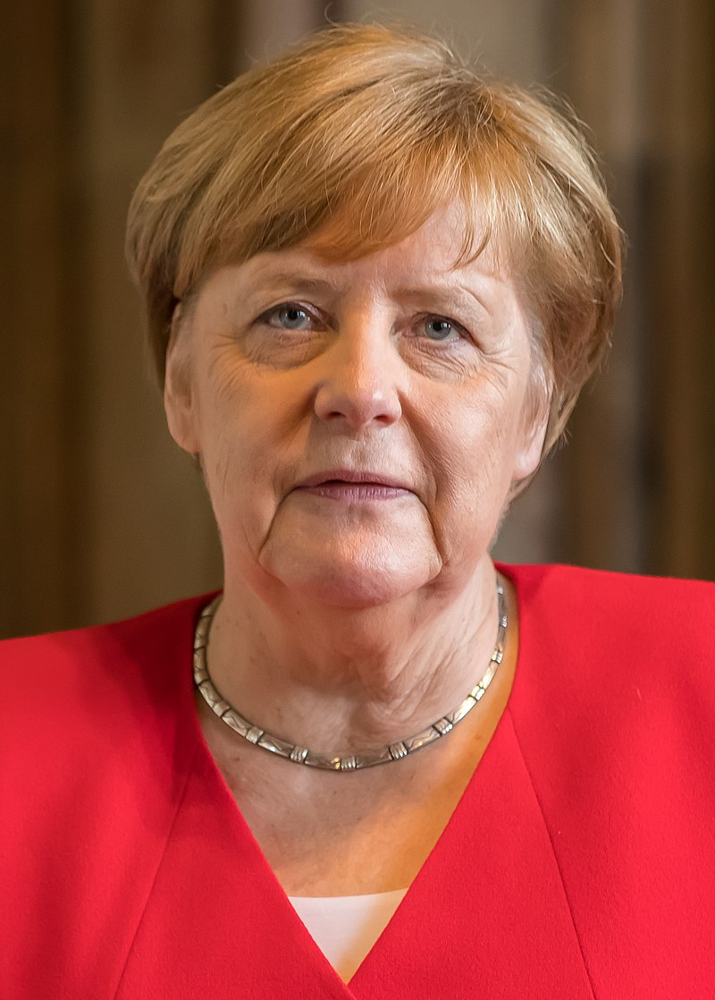

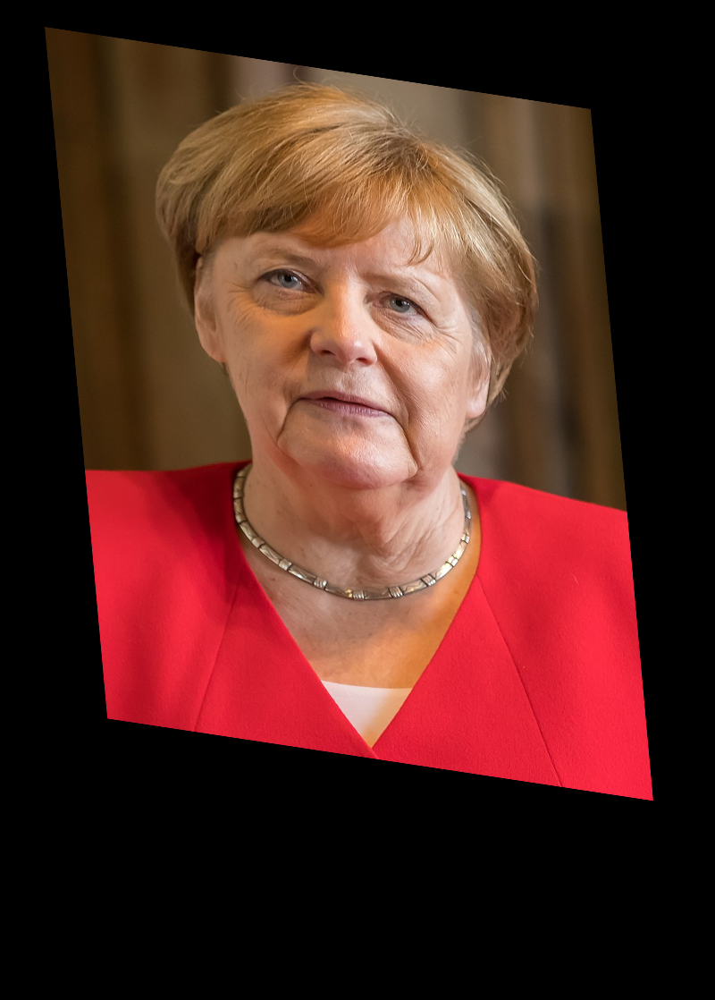

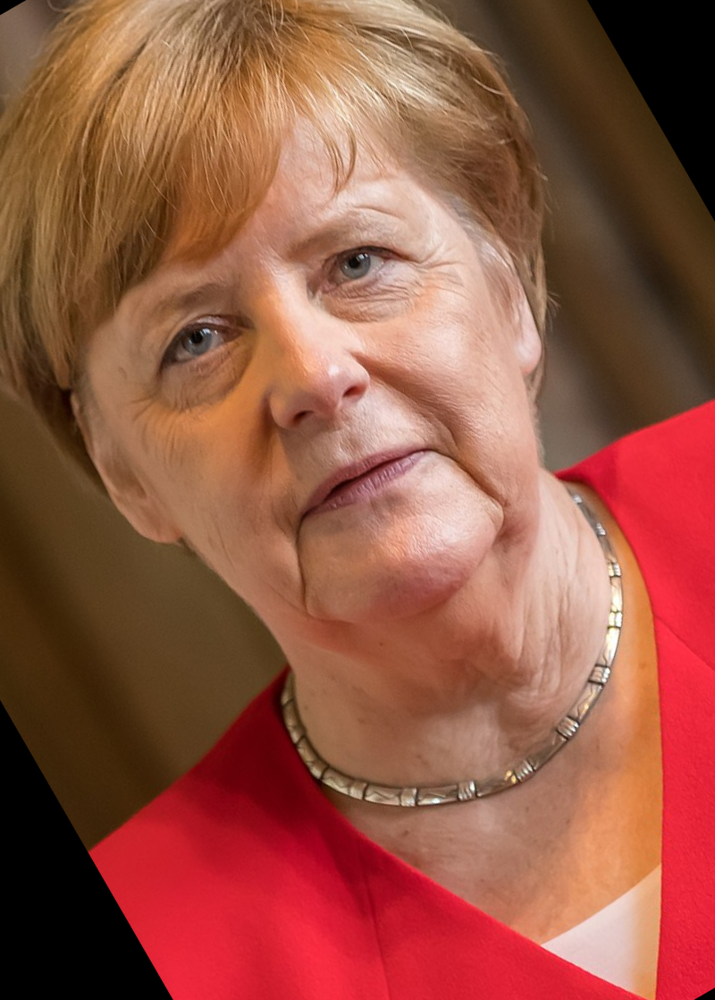

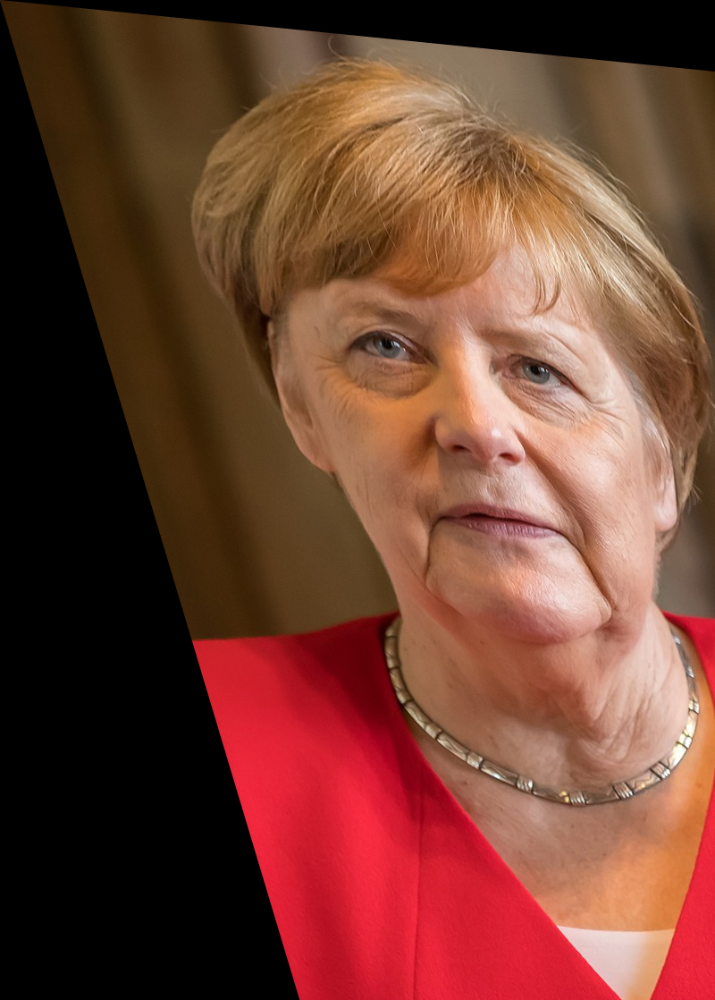

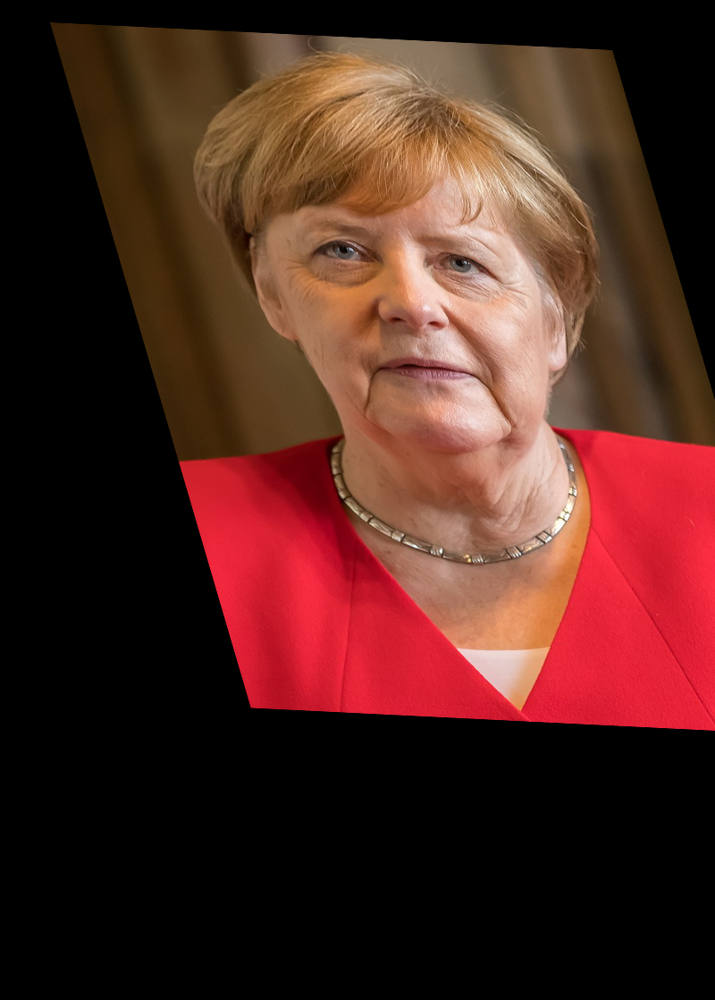

In [ ]:
def affine_from_3pts(img, src_pts, dst_pts):
    M = cv2.getAffineTransform(np.float32(src_pts), np.float32(dst_pts))
    h, w = img.shape[:2]
    dst = cv2.warpAffine(img, M, (w, h))
    return dst

def affine_rotate_scale_translate(img, center, angle, scale, tx, ty):
    M = cv2.getRotationMatrix2D(center, angle, scale)
    M[0,2] += tx
    M[1,2] += ty
    h, w = img.shape[:2]
    dst = cv2.warpAffine(img, M, (w, h))
    return dst

def affine_shear(img, shear_x=0.0, shear_y=0.0):
    h, w = img.shape[:2]
    M = np.array([[1, shear_x, 0],
                  [shear_y, 1, 0]], dtype=np.float32)
    dst = cv2.warpAffine(img, M, (w, h))
    return dst

def affine_composite(img, src_pts, dst_pts, extra_shear=(0,0)):
    M1 = cv2.getAffineTransform(np.float32(src_pts), np.float32(dst_pts))
    shear_x, shear_y = extra_shear
    S = np.array([[1, shear_x, 0],
                  [shear_y, 1, 0]], dtype=np.float32)
    M = S.dot(np.vstack([M1, [0,0,1]]))[:2, :]
    h, w = img.shape[:2]
    dst = cv2.warpAffine(img, M, (w, h))
    return dst

def test_affine_methods(image_path):
    img = cv2.imread(image_path)
    if img is None:
        print("Не удалось загрузить изображение")
        return

    h, w = img.shape[:2]
    src = [(0, 0), (w-1, 0), (0, h-1)]
    dst = [(w*0.0 + 50, h*0.0 + 30),
           (w*0.8 + 20, h*0.1 + 10),
           (w*0.1 + 40, h*0.7 + 20)]

    res1 = affine_from_3pts(img, src, dst)
    center = (w/2, h/2)
    res2 = affine_rotate_scale_translate(img, center, angle=30, scale=1.2, tx=20, ty=-10)
    res3 = affine_shear(img, shear_x=0.3, shear_y=0.1)
    res4 = affine_composite(img, src, dst, extra_shear=(0.2, -0.1))

    cv2_imshow(img)
    cv2_imshow(res1)
    cv2_imshow(res2)
    cv2_imshow(res3)
    cv2_imshow(res4)

test_affine_methods("Angela_Merkel.jpg")

##Задание 5
С помощью OpenCV реализуйте несколько вариантов (3-4) перспективного преобразования произвольного изображения с ключевыми точками (https://docs.opencv.org/4.x/da/d6e/tutorial_py_geometric_transformations.html)

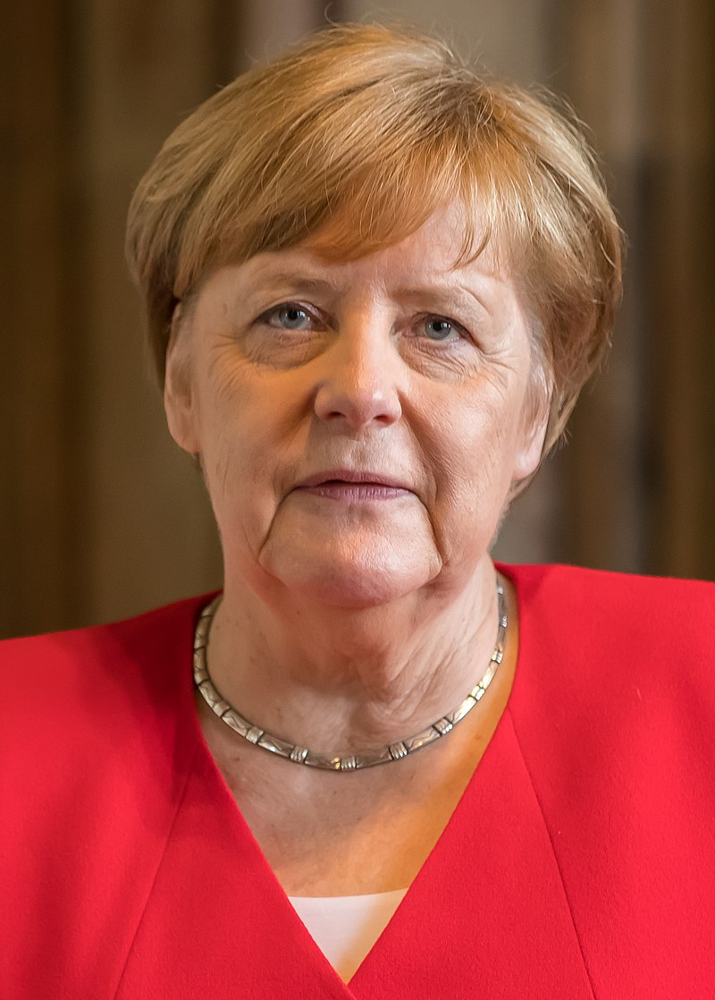

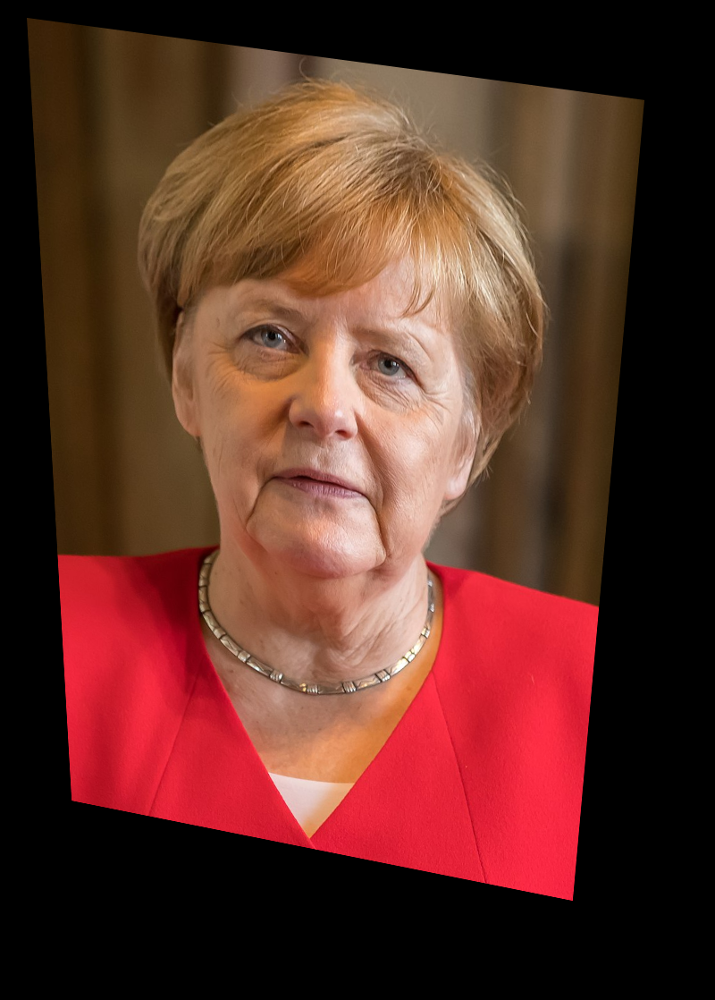

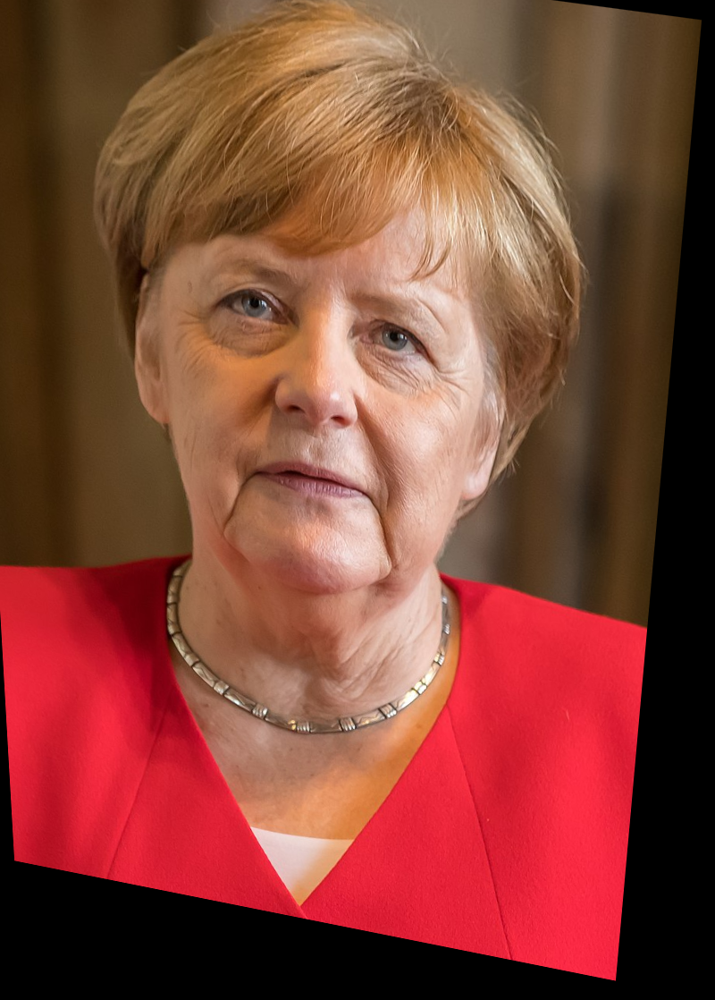

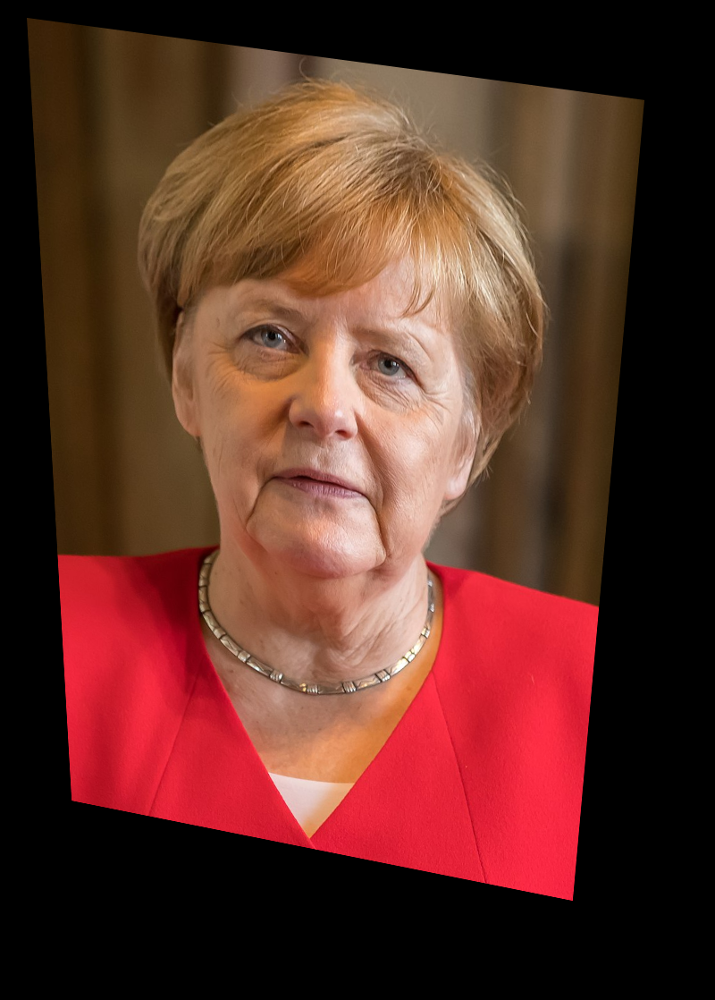

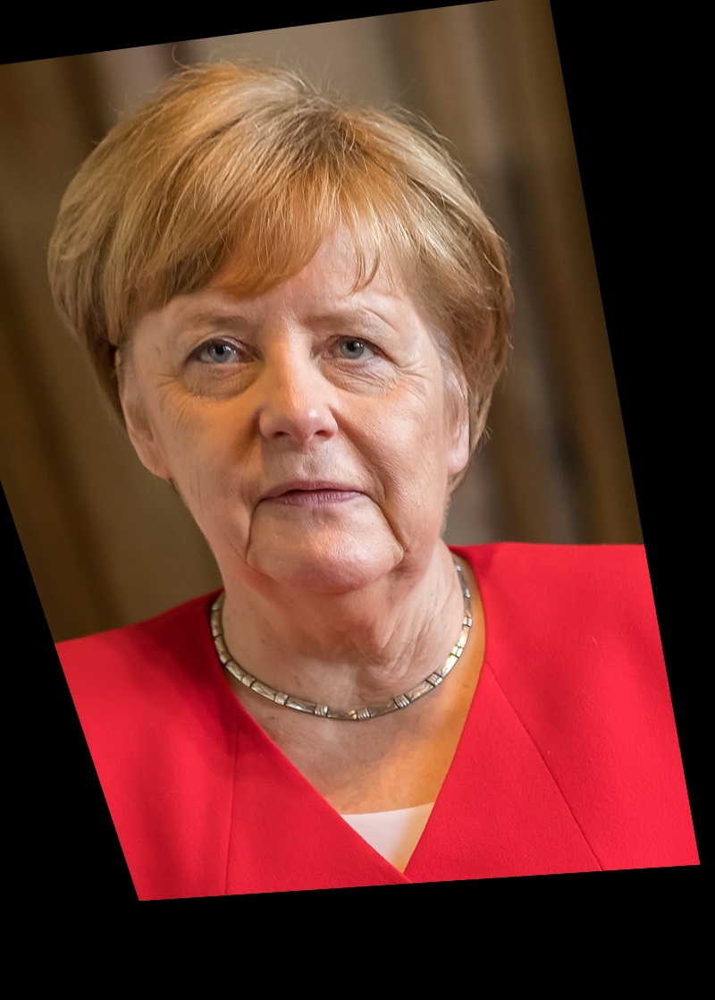

In [ ]:
def perspective_from_4pts(img, src_pts, dst_pts):
    M = cv2.getPerspectiveTransform(np.float32(src_pts), np.float32(dst_pts))
    h, w = img.shape[:2]
    dst = cv2.warpPerspective(img, M, (w, h))
    return dst

def perspective_scaled(img, src_pts, dst_pts, scale=1.0):
    h, w = img.shape[:2]
    dst_pts2 = []
    cx, cy = w/2, h/2
    for (x, y) in dst_pts:
        dx = x - cx
        dy = y - cy
        dst_pts2.append((cx + dx * scale, cy + dy * scale))
    M = cv2.getPerspectiveTransform(np.float32(src_pts), np.float32(dst_pts2))
    dst = cv2.warpPerspective(img, M, (w, h))
    return dst

def perspective_with_bbox(img, src_pts, dst_pts, output_size):
    M = cv2.getPerspectiveTransform(np.float32(src_pts), np.float32(dst_pts))
    dst = cv2.warpPerspective(img, M, output_size)
    return dst

def perspective_composite(img, src_pts, dst_pts, extra_affine=None):
    M_p = cv2.getPerspectiveTransform(np.float32(src_pts), np.float32(dst_pts))
    if extra_affine is not None:
        A = np.vstack([extra_affine, [0,0,1]])
        M_full = A.dot(M_p)
    else:
        M_full = M_p
    h, w = img.shape[:2]
    dst = cv2.warpPerspective(img, M_full, (w, h))
    return dst

def test_perspective_methods(image_path):
    img = cv2.imread(image_path)
    if img is None:
        print("Не удалось загрузить изображение")
        return

    h, w = img.shape[:2]
    src = [(0, 0), (w-1, 0), (w-1, h-1), (0, h-1)]
    dst = [(w*0.0 + 30, h*0.0 + 20),
           (w*0.9, h*0.1),
           (w*0.8, h*0.9),
           (w*0.1, h*0.8)]

    res1 = perspective_from_4pts(img, src, dst)
    res2 = perspective_scaled(img, src, dst, scale=1.2)
    res3 = perspective_with_bbox(img, src, dst, output_size=(w, h))
    extra = cv2.getRotationMatrix2D((w/2, h/2), 15, 1.1)
    res4 = perspective_composite(img, src, dst, extra_affine=extra)

    cv2_imshow(img)
    cv2_imshow(res1)
    cv2_imshow(res2)
    cv2_imshow(res3)
    cv2_imshow(res4)

test_perspective_methods("Angela_Merkel.jpg")

##Задание 6*

С помощью OpenCV реализуйте SURF дескриптор для произвольного изображения (https://docs.opencv.org/3.4/df/dd2/tutorial_py_surf_intro.html)

#Задание 7
С помощью OpenCV реализуйте SIFT дескриптор для произвольного изображения (https://docs.opencv.org/4.x/da/df5/tutorial_py_sift_intro.html)

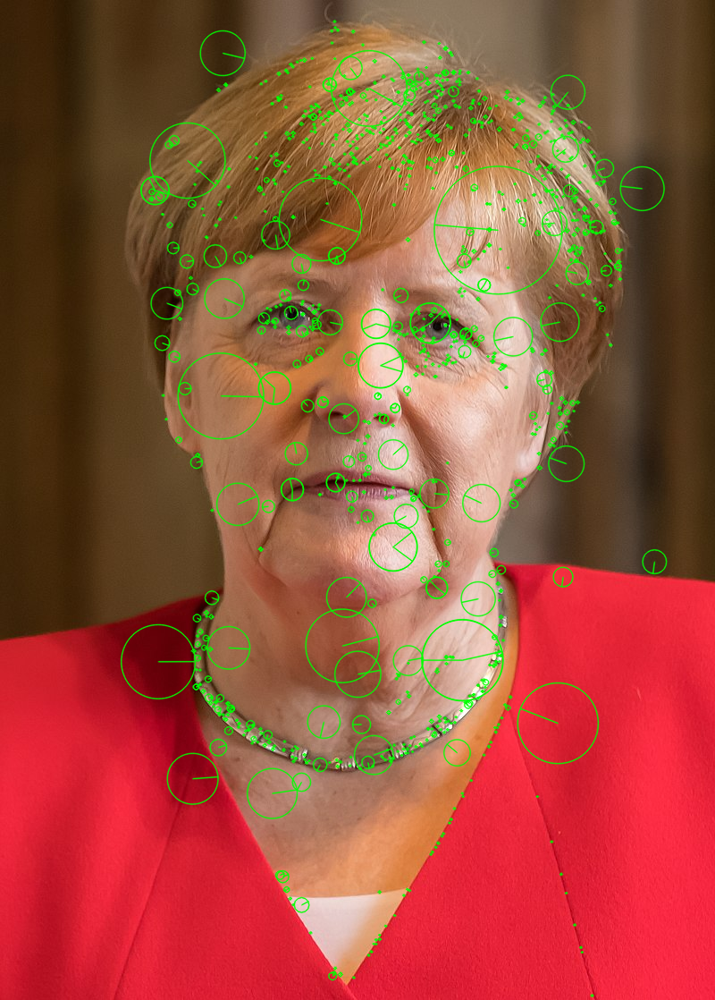

Количество ключевых точек: 1197
Размер дескриптора: (1197, 128)


In [ ]:
import cv2
from google.colab.patches import cv2_imshow

def sift_descriptor(image_path):
    img = cv2.imread(image_path)
    if img is None:
        print("Ошибка загрузки изображения")
        return
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    sift = cv2.SIFT_create()
    kp, des = sift.detectAndCompute(gray, None)
    img_kp = cv2.drawKeypoints(img, kp, None, (0, 255, 0), 4)
    cv2_imshow(img_kp)
    print("Количество ключевых точек:", len(kp))
    print("Размер дескриптора:", des.shape)

image_path = "Angela_Merkel.jpg"
sift_descriptor(image_path)


#Выводы

Масштабирование, сдвиг, поворот, аффинные и перспективные преобразования позволяют изменять геометрию изображения, сохраняя его структуру.
SIFT и SURF-дескрипторы обеспечивают устойчивое выделение и сравнение ключевых точек, что делает их основой для задач распознавания, сопоставления и трекинга объектов.